# Goal: Create datasets + Train S2/S1 single sensor Siamese/Concat Unets + S1+S2 multisensor Concat Unet

In [25]:
%load_ext autoreload
%autoreload 2

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import pandas as pd
pd.set_option('display.max_colwidth', 250)
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import glob
import tifffile
import rasterio

from src.data import get_dataloaders
from src.train import train
from src.hyperparams import HyperParams, open_from_yaml
from src.visualize import visualize_s2_concat_bands_path, visualize_s1_path

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
alerts_with_data = len(set([k.split("/")[1] for k in glob.glob(f"data/*/*/*.tif")]))
print(f"There is any satellite data for {alerts_with_data} alerts")

alerts_with_s1 = len(set([k.split("/")[1] for k in glob.glob(f"data/*/sentinel1/*.tif")]))
alerts_with_ls = len(set([k.split("/")[1] for k in glob.glob(f"data/*/landsat/*.tif")]))
alerts_with_mux = len(set([k.split("/")[1] for k in glob.glob(f"data/*/cbers4a/*MUX*.tif")]))
alerts_with_wpm = len(set([k.split("/")[1] for k in glob.glob(f"data/*/cbers4a/*WPM*.tif")]))
alerts_with_s2_l2a = len(set([k.split("/")[1] for k in glob.glob(f"data/*/sentinel2/*L2A*.tif")]))
alerts_with_s2_16d = len(set([k.split("/")[1] for k in glob.glob(f"data/*/sentinel2/*16D*.tif")]))
alerts_with_s2 = len(set([k.split("/")[1] for k in glob.glob(f"data/*/sentinel2/*L2A*.tif")] + [k.split("/")[1] for k in glob.glob(f"data/*/sentinel2/*16D*.tif")]))

print(f"There is any S2 data for {alerts_with_s2} alerts")
print(f"There is S2 L2A data for {alerts_with_s2_l2a} alerts")
print(f"There is S2 16D data for {alerts_with_s2_16d} alerts")
print(f"There is LS data for     {alerts_with_ls} alerts")
print(f"There is S1 data for     {alerts_with_s1} alerts")
print(f"There is MUX data for    {alerts_with_mux} alerts")
print(f"There is WPM data for    {alerts_with_wpm} alerts")

There is any satellite data for 82 alerts
There is any S2 data for 77 alerts
There is S2 L2A data for 68 alerts
There is S2 16D data for 63 alerts
There is LS data for     59 alerts
There is S1 data for     44 alerts
There is MUX data for    31 alerts
There is WPM data for    21 alerts


# S2 single sensor, single before/after image
- Now that I have managed to align L2A and 16D products for Sentinel2, I can train a model on their combined data.
- For 100 alerts, we have some data for 82 of them. From those 82, we have S2 L2A data for 68 of them and S2 16D data for 63. Using them together, we have data for 77 alerts.
- As this is still low data, we will
  - use pretrained encoder
  - create a cross validation dataset with 5 folds to get more robust performance on the full dataset
  - create one deforestation example per alert by using the first "before" image and the last "after" image with respect to the deforestation event. With good labels, we would like to change this by using "before" and "after images as close as possible to each other to train the model to detect deforestation events from one image to the next. But here, as our label timings are really not that good looking, I found that the before and after images right next to each other do not feature the deforestation changes.
  - create negative examples of deforestation by sampling inside the "before" images and adding an empty deforestation mask. Same for within the "after" images. This is important as in earlier experiments, I found the model to learn to predict always deforestation in the middle of the scene as this was a good baseline if every example features deforestation and is also roughly centered on it. Random cropping also helps here as it moves the deforestation position to the sides of the image.

## Create cross validation dataset

In [11]:
df = gpd.read_file("data/mapbiomas_alerts.geojson")
events_sorted_by_area = df.sort_values("areaHa", ascending=False)["alertCode"].tolist()
df.shape

(100, 6)

In [12]:
paths_before_, paths_after_ = [], []
clouds_nodata_before_, clouds_nodata_after_ = [], []
label_paths, deforest_pxs = [], []
s2_valid_data_events = []
seed = 11219
seed_count = 0
for event_id in events_sorted_by_area[:]:
    s2_l2a_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel2/*L2A*.tif") if not "ndvi" in k and not "ndwi" in k and not "compressed" in k])
    s2_16d_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel2/*16D*.tif") if not "ndvi" in k and not "ndwi" in k and not "compressed" in k])
    s2_paths = s2_l2a_paths + s2_16d_paths
    if len(s2_paths) == 0:
        continue
    mask_path = glob.glob(f"data/{event_id}/*_mask.tif")[0]
    mask_date = mask_path.split("/")[-1].split('_')[1]
    mask_date_str = f"{mask_date[:4]}-{mask_date[4:6]}-{mask_date[6:8]}"
    mask_date = datetime.strptime(mask_date, "%Y%m%d")
    
    date = mask_path.split("/")[-1].split('_')[1]
    # Sort by the date right before the .tif
    paths = sorted(s2_paths, key=lambda p: datetime.strptime(p.split('_')[-1].split('.')[0], "%Y%m%d"))
    
    paths_after, paths_before = [], []
    clouds_nodata_after, clouds_nodata_before = [], []
    for path in paths:
        img_orig = tifffile.imread(path)
        if "L2A" in path:
            scl = img_orig[:, :, -2].copy()
            img_orig = img_orig[:, :, [11, 8, 4]]
        else:
            scl = img_orig[:, :, -1].copy()
            img_orig = img_orig[:, :, [10, 7, 3]]
        img_orig = img_orig.astype(np.float32)
        if scl.max() > 11:
            if scl.max() > 50:
                factor = 6
            elif scl.max() > 45:
                factor = 5
            elif scl.max() >= 40:
                factor = 4.5
            else:
                factor = 4
            img_orig = (img_orig / factor).round(0)
            scl_clean = (scl / factor).round(0).astype('uint8')   # back to 0..11
        else:
            factor = 1
            scl_clean = scl.copy()
        img_orig[img_orig == 0] = np.nan
        # low values, but all minimum above 1000 ==> Subtract by 1000
        if (np.nanmin(img_orig, axis=(0,1)) > 1000).sum() == 3:
            img_orig = img_orig - 1000
            img_orig[img_orig < 0] = np.nan
        
        cloudshadowmask = np.isin(scl_clean, [3, 8, 9, 10]).astype(np.uint8)   # clouds + shadows
        clouds_perc = 100 * cloudshadowmask.sum() / (img_orig.shape[0] * img_orig.shape[1])
        nodata_perc = 100 * np.isnan(img_orig[:, :, 0]).sum() / (img_orig.shape[0] * img_orig.shape[1])
        
        date = path.split("/")[-1].split('.')[0].split('_')[-1]
        date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
            
        date = datetime.strptime(path.split('_')[-1].split('.')[0], "%Y%m%d")
        if date > mask_date:
            paths_after.append(path)
            clouds_nodata_after.append(clouds_perc + nodata_perc)
        else:
            paths_before.append(path)
            clouds_nodata_before.append(clouds_perc + nodata_perc)
    print(f"{event_id}: {len(s2_l2a_paths):2} S2 L2A paths, {len(s2_16d_paths):2} 16D paths, {len(paths_before):2} before, {len(paths_after):2} after, ({mask_date})")
    if len(clouds_nodata_before) > 0 and len(clouds_nodata_after) > 0:
        print(f" --> min nodata/clouds before: {min(clouds_nodata_before):5.1f}%, after: {min(clouds_nodata_after):5.1f}%")
    if len(paths_before) > 0 and len(paths_after) > 0:
        label_path = glob.glob(f"data/{event_id}/*_mask.tif")[0]
        label_paths.append(label_path)
        label = tifffile.imread(label_path)
        deforest_pxs.append((label == 255).sum())
        
        s2_valid_data_events.append(event_id)
        paths_after_.append(paths_after)
        clouds_nodata_after_.append(clouds_nodata_after)
        paths_before_.append(paths_before)
        clouds_nodata_before_.append(clouds_nodata_before)

    if len(paths_before) > 2: # Create a new no deforestation example from the before images
        before_indices = np.arange(len(paths_before))
        np.random.seed(seed + seed_count)
        seed_count += 1
        np.random.shuffle(before_indices)
        sorted_indices_new_example = sorted(before_indices[:2])
        sorted_paths_new_example = [path for k, path in enumerate(paths_before) if k in sorted_indices_new_example]
        
        s2_valid_data_events.append(f"{event_id}_no_change_before")
        label_paths.append("empty")
        deforest_pxs.append(0)
        paths_after_.append([sorted_paths_new_example[1]])
        clouds_nodata_after_.append([clouds_nodata_before[sorted_indices_new_example[1]]])
        paths_before_.append([sorted_paths_new_example[0]])
        clouds_nodata_before_.append([clouds_nodata_before[sorted_indices_new_example[0]]])
        
    if len(paths_after) > 2: # Create a new no deforestation example from the after images
        after_indices = np.arange(len(paths_after))
        np.random.seed(seed + seed_count)
        seed_count += 1
        np.random.shuffle(after_indices)
        sorted_indices_new_example = sorted(after_indices[:2])
        sorted_paths_new_example = [path for k, path in enumerate(paths_after) if k in sorted_indices_new_example]
        
        s2_valid_data_events.append(f"{event_id}_no_change_after")
        label_paths.append("empty")
        deforest_pxs.append(0)
        paths_after_.append([sorted_paths_new_example[1]])
        clouds_nodata_after_.append([clouds_nodata_after[sorted_indices_new_example[1]]])
        paths_before_.append([sorted_paths_new_example[0]])
        clouds_nodata_before_.append([clouds_nodata_after[sorted_indices_new_example[0]]])
len(s2_valid_data_events)

1389384:  0 S2 L2A paths,  1 16D paths,  1 before,  0 after, (2025-05-01 00:00:00)
1389549: 16 S2 L2A paths,  7 16D paths, 15 before,  8 after, (2025-05-01 00:00:00)
 --> min nodata/clouds before:  15.6%, after:   0.0%
1389572: 15 S2 L2A paths,  0 16D paths, 10 before,  5 after, (2025-05-19 00:00:00)
 --> min nodata/clouds before:  44.9%, after:  60.2%
1389728:  0 S2 L2A paths,  2 16D paths,  1 before,  1 after, (2025-05-31 00:00:00)
 --> min nodata/clouds before:   5.0%, after:   0.0%
1389158:  1 S2 L2A paths,  0 16D paths,  1 before,  0 after, (2025-05-08 00:00:00)
1389503:  8 S2 L2A paths,  0 16D paths,  5 before,  3 after, (2025-05-16 00:00:00)
 --> min nodata/clouds before:   0.0%, after:   0.0%
1389607:  0 S2 L2A paths,  4 16D paths,  4 before,  0 after, (2025-05-01 00:00:00)
1389968: 13 S2 L2A paths,  3 16D paths, 13 before,  3 after, (2025-05-15 00:00:00)
 --> min nodata/clouds before:   0.0%, after:   0.0%
1389833:  2 S2 L2A paths,  3 16D paths,  5 before,  0 after, (2025-05-0

177

In [ ]:
df = pd.DataFrame({"event_id": s2_valid_data_events, 
                   "deforest_pxs": deforest_pxs, "label_path": label_paths,
                   "paths_before": paths_before_, "clouds_nodata_before": clouds_nodata_before_,
                   "paths_after": paths_after_, "clouds_nodata_after": clouds_nodata_after_})
df.to_pickle("catalogues/2025_08_19_s2_rawdata.pkl")
df.shape

In [13]:
df = pd.read_pickle("catalogues/2025_08_19_s2_rawdata.pkl")
df.shape

(177, 7)

In [14]:
def best_before_path(row):
    # FURTHEST AWAY FROM DEFORESTATON DATE
    clouds_nodata_before = row["clouds_nodata_before"]
    paths_before = row["paths_before"]
    
    # # CLOSEST TO DEFORESTATON DATE
    # clouds_nodata_before = row["clouds_nodata_before"][::-1]
    # paths_before = row["paths_before"][::-1]

    # Take the closest deforestation date with clouds < 3%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 3:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 10%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 10:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 30%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 30:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 100%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 100:
            return path, clouds_nodata
    # Else return the closest path
    return paths_before[0], clouds_nodata_before[0]

def best_after_path(row):
    # FURTHEST AWAY FROM DEFORESTATON DATE
    clouds_nodata_after = row["clouds_nodata_after"][::-1]
    paths_after = row["paths_after"][::-1]
    
    # # CLOSEST TO DEFORESTATON DATE
    # clouds_nodata_after = row["clouds_nodata_after"]
    # paths_after = row["paths_after"]

    # Take the closest deforestation date with clouds < 3%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 3:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 10%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 10:
            return path, clouds_nodata
    # Take the closest deforestation  date with clouds < 30%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 30:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 100%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 100:
            return path, clouds_nodata
    # Else return the closest path
    return paths_after[0], clouds_nodata_after[0]
    
df["path_best_before"] = df[["paths_before", "clouds_nodata_before"]].apply(lambda row: best_before_path(row)[0], axis=1)
df["path_best_after"] = df[["paths_after", "clouds_nodata_after"]].apply(lambda row: best_after_path(row)[0], axis=1)

df["clouds_nodata_best_before"] = df[["paths_before", "clouds_nodata_before"]].apply(lambda row: best_before_path(row)[1], axis=1)
df["clouds_nodata_best_after"] = df[["paths_after", "clouds_nodata_after"]].apply(lambda row: best_after_path(row)[1], axis=1)

<Axes: >

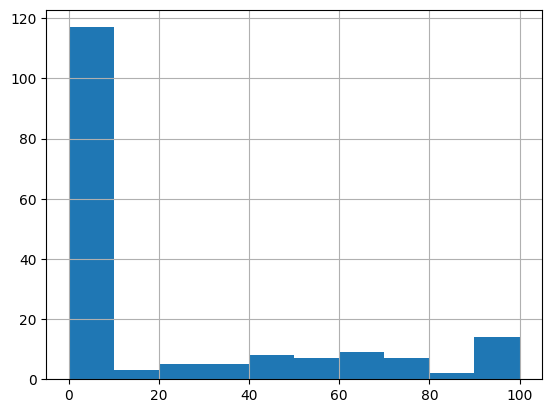

In [15]:
df["clouds_nodata_best_before"].hist()

<Axes: >

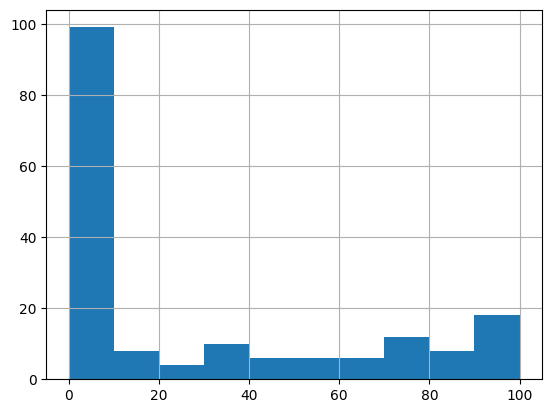

In [16]:
df["clouds_nodata_best_after"].hist()

Only use an example if it has low clouds/nodata in before/after.

In [17]:
print(df.shape)
df = df[(df["label_path"]=="empty") | ((df["clouds_nodata_best_before"] < 30) & (df["clouds_nodata_best_after"] < 30))]
print(df.shape)

(177, 11)
(165, 11)


Create 5 folds that preserve event_ids and balance the sum of deforestation px over all folds

In [18]:
df["event_id"] = df["event_id"].apply(lambda x: str(x))
df["event_id_for_folds"] = df["event_id"].apply(lambda x: x.split("_")[0])

In [19]:
event_id_for_folds = df["event_id_for_folds"].unique().tolist()
len(event_id_for_folds)

70

In [20]:
how_many_folds = 5
seed_start = 2222
best_std = 100000
best_seed = seed_start
event_id_for_folds = sorted(df["event_id_for_folds"].unique().tolist())

for seed in range(seed_start, seed_start + 1000):
    np.random.seed(seed)
    np.random.shuffle(event_id_for_folds)
    
    folds = list(range(how_many_folds)) * (len(event_id_for_folds) // how_many_folds + 1)
    np.random.seed(seed)
    np.random.shuffle(folds)
    folds = folds[:len(event_id_for_folds)]
    
    for fold_nb in range(how_many_folds):
        event_ids_per_fold = [event_id for fold, event_id in zip(folds, event_id_for_folds) if fold==fold_nb]
        # print(f"Fold {fold_nb}: {len(event_ids_per_fold)} Event Ids")
        df.loc[df["event_id_for_folds"].isin(event_ids_per_fold), "fold"] = fold_nb
    
    std_deforest_pxs = df.groupby("fold")["deforest_pxs"].sum().std()
    if std_deforest_pxs < best_std:
        best_std = std_deforest_pxs
        best_seed = seed
        best_df = df.copy()
        print(f"Seed {seed}, Std Deforest Pxs: {std_deforest_pxs:.0f}")
        # display(df.groupby("fold")["deforest_pxs"].sum().to_frame())
df = best_df.copy()

Seed 2222, Std Deforest Pxs: 3162
Seed 2243, Std Deforest Pxs: 3086
Seed 2260, Std Deforest Pxs: 2856
Seed 2320, Std Deforest Pxs: 2745
Seed 2389, Std Deforest Pxs: 2352
Seed 2411, Std Deforest Pxs: 1978
Seed 2462, Std Deforest Pxs: 1860
Seed 2508, Std Deforest Pxs: 1585
Seed 2520, Std Deforest Pxs: 969


In [21]:
df.groupby("fold")["deforest_pxs"].sum()

fold
0.0    11810
1.0    10712
2.0    12985
3.0    10691
4.0    11067
Name: deforest_pxs, dtype: int64

To speed up data loading during training, it helps to save the tifs uncompressed.
- Even faster would be to do most preprocessing before, e.g. loading before/after images, eventual resizing, dropping of bands, normalizing, subtracting offsets, ... and in the dataloader only loading in the final array and doing augmentations.

In [ ]:
for idx, row in df.iterrows():
    output_path = row["path_best_before"].replace(".tif", "_uncompressed.tif")
    if not os.path.exists(output_path):
        with rasterio.open(row["path_best_before"]) as src:
            profile = src.profile
            profile["compress"] = None
            with rasterio.open(output_path, "w", **profile) as dst:
                dst.write(src.read())

    output_path = row["path_best_after"].replace(".tif", "_uncompressed.tif")
    if not os.path.exists(output_path):
        with rasterio.open(row["path_best_after"]) as src:
            profile = src.profile
            profile["compress"] = None
            with rasterio.open(output_path, "w", **profile) as dst:
                dst.write(src.read())

df["path_best_before"] = df["path_best_before"].apply(lambda x: x.replace(".tif", "_uncompressed.tif"))
df["path_best_after"] = df["path_best_after"].apply(lambda x: x.replace(".tif", "_uncompressed.tif"))

In [ ]:
os.makedirs("catalogues", exist_ok=True)
df.to_pickle("catalogues/2025_08_19_s2_l2a_16d.pkl")
print(df.shape)

## Train

In [26]:
exp_nb = "S2_l2a_16d_1-3"
path = "catalogues/2025_08_19_s2_l2a_16d.pkl"
hps_dict = {
    ############
    # Data
    ############
    "df_path": path,

    ############
    # Training
    ############

    ## Experiment Setup
    "name": f"Exp_{exp_nb}",

    ## Model
    "num_classes": 1,
    "input_channel": 13,
    "backbone": "timm_efficientnet_b1",
    "pretrained": "noisy-student",
    "model": "siamese_unet",

    # Training Setup
    "print_freq": 500,
    "use_fp16": 0,
    "patience": 8,
    "epoch_start_scheduler": 10,

    # Optimizer
    "lr": 0.001,
    "weight_decay": 0.0,

    ## Data Augmentation on CPU
    "train_crop_size": 256 + 32 + 32,
    "train_batch_size": 16, #32
    "da_brightness_magnitude": 0.0,
    "da_contrast_magnitude": 0.0,

    # Data Augmentation on GPU
    "gpu_da_params": [0.25],
    
    ### Loss, Metric
    "alpha": 0.25,
}
for fold_nb in range(0, 1):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 0 --> Train: 137, Val: 28
####################################################################################################
Last 5 sample weights: [1, 1, 1, 1, 1]


data/1388077/sentinel2/1388077_sentinel2_S2-16D_V2_034020_20241031_20241031_uncompressed.tif 19
data/1388077/sentinel2/1388077_sentinel2_S2B_MSIL2A_20250122T130249_N0511_R095_T23LRE_20250122T162739_20250122_uncompressed.tif
data/1388077/1388077_20250101_mask.tif
Mask unique values: [0 1]


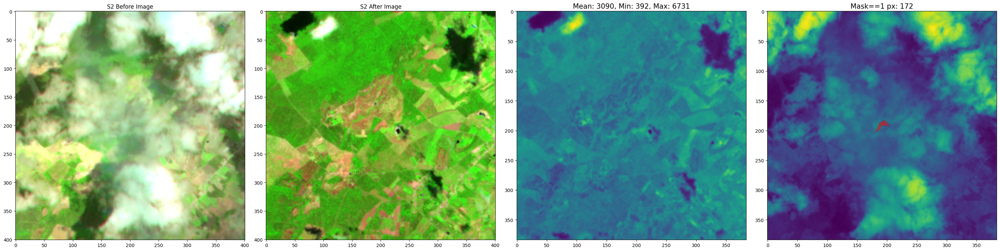

In [27]:
val_dataset.visualize(1)

data/1389443/sentinel2/1389443_sentinel2_S2B_MSIL2A_20250530T135709_N0511_R067_T21LXJ_20250530T172641_20250530_uncompressed.tif 130
data/1389443/sentinel2/1389443_sentinel2_S2B_MSIL2A_20250609T135659_N0511_R067_T21LXK_20250609T172547_20250609_uncompressed.tif
empty
Mask unique values: [0]


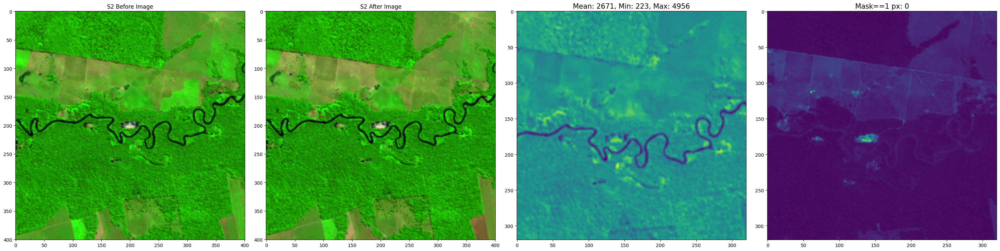

In [28]:
train_dataset.visualize(1)

In [ ]:
for fold_nb in range(0, 5):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    num_batches = 250 // (hps.train_batch_size * torch.cuda.device_count())
    hps.num_batches = num_batches
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)

    best_metric, best_metric_epoch = train(hps, train_loader, val_loader)

# S1 single sensor, single before/after image
- For 100 alerts, we have at least one before and after image for S1 for 40 alerts. This number is low, but at least we don't have to deal with clouds covering the areas we are monitoring.
- As this is still low data, we will
  - use pretrained encoder
  - create a cross validation dataset with 5 folds to get more robust performance on the full dataset
  - create one deforestation example per alert by using the first "before" image and the last "after" image with respect to the deforestation event. With good labels, we would like to change this by using "before" and "after images as close as possible to each other to train the model to detect deforestation events from one image to the next. But here, as our label timings are really not that good looking, I found that the before and after images right next to each other do not feature the deforestation changes.
  - create negative examples of deforestation by sampling inside the "before" images and adding an empty deforestation mask. Same for within the "after" images. This is important as in earlier experiments, I found the model to learn to predict always deforestation in the middle of the scene as this was a good baseline if every example features deforestation and is also roughly centered on it. Random cropping also helps here as it moves the deforestation position to the sides of the image.

## Create cross validation dataset

In [ ]:
df = gpd.read_file("data/mapbiomas_alerts.geojson")
events_sorted_by_area = df.sort_values("areaHa", ascending=False)["alertCode"].tolist()
df.shape

In [ ]:
paths_before_, paths_after_ = [], []
clouds_nodata_before_, clouds_nodata_after_ = [], []
s1_valid_data_events = []
label_paths, deforest_pxs = [], []
for event_id in events_sorted_by_area[:]:
    s1_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel1/*.tif") if not "_nrpb" in k and not "_rfdi" in k and not "_rvi" in k and not "_vv_vh_ratio" in k and not "compressed" in k])
    if len(s1_paths) == 0:
        continue
    mask_path = glob.glob(f"data/{event_id}/*_mask.tif")[0]
    mask_date = mask_path.split("/")[-1].split('_')[1]
    mask_date_str = f"{mask_date[:4]}-{mask_date[4:6]}-{mask_date[6:8]}"
    mask_date = datetime.strptime(mask_date, "%Y%m%d")
    
    date = mask_path.split("/")[-1].split('_')[1]
    # Sort by the date right before the .tif
    paths = sorted(s1_paths, key=lambda p: datetime.strptime(p.split('_')[-1].split('.')[0], "%Y%m%d"))
    paths_after, paths_before = [], []
    nodata_after, nodata_before = [], []
    for path in paths:
        img_orig = tifffile.imread(path)
        nodata_perc = 100 * (img_orig[:, :, 0] == 0).sum() / (img_orig.shape[0] * img_orig.shape[1])
        date = path.split("/")[-1].split('.')[0].split('_')[-1]
        date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
            
        date = datetime.strptime(path.split('_')[-1].split('.')[0], "%Y%m%d")
        if date > mask_date:
            paths_after.append(path)
            nodata_after.append(nodata_perc)
        else:
            paths_before.append(path)
            nodata_before.append(nodata_perc)
    print(f"{event_id}: {len(paths):2} S1 paths, {len(paths_before):2} before, {len(paths_after):2} after, ({mask_date})")
    if len(nodata_before) > 0 and len(nodata_after) > 0:
        print(f" --> min nodata before: {min(nodata_before):5.1f}%, after: {min(nodata_after):5.1f}%")
    if len(paths_before) > 0 and len(paths_after) > 0:
        label_paths.append(mask_path)
        label = tifffile.imread(mask_path)
        deforest_pxs.append((label == 255).sum())
        
        s1_valid_data_events.append(event_id)
        paths_after_.append(paths_after)
        clouds_nodata_after_.append(nodata_after)
        paths_before_.append(paths_before)
        clouds_nodata_before_.append(nodata_before)

        if len(paths_before) > 2: # Create a new no deforestation example from the before images
            before_indices = np.arange(len(paths_before))
            np.random.seed(seed + seed_count)
            seed_count += 1
            np.random.shuffle(before_indices)
            sorted_indices_new_example = sorted(before_indices[:2])
            sorted_paths_new_example = [path for k, path in enumerate(paths_before) if k in sorted_indices_new_example]
            
            s1_valid_data_events.append(f"{event_id}_no_change_before")
            label_paths.append("empty")
            deforest_pxs.append(0)
            paths_after_.append([sorted_paths_new_example[1]])
            clouds_nodata_after_.append([nodata_before[sorted_indices_new_example[1]]])
            paths_before_.append([sorted_paths_new_example[0]])
            clouds_nodata_before_.append([nodata_before[sorted_indices_new_example[0]]])
            
        if len(paths_after) > 2: # Create a new no deforestation example from the after images
            after_indices = np.arange(len(paths_after))
            np.random.seed(seed + seed_count)
            seed_count += 1
            np.random.shuffle(after_indices)
            sorted_indices_new_example = sorted(after_indices[:2])
            sorted_paths_new_example = [path for k, path in enumerate(paths_after) if k in sorted_indices_new_example]
            
            s1_valid_data_events.append(f"{event_id}_no_change_after")
            label_paths.append("empty")
            deforest_pxs.append(0)
            paths_after_.append([sorted_paths_new_example[1]])
            clouds_nodata_after_.append([nodata_after[sorted_indices_new_example[1]]])
            paths_before_.append([sorted_paths_new_example[0]])
            clouds_nodata_before_.append([nodata_after[sorted_indices_new_example[0]]])
len(s1_valid_data_events)

In [ ]:
len(s1_valid_data_events), len(deforest_pxs), len(label_paths)

In [ ]:
df = pd.DataFrame({"event_id": s1_valid_data_events, 
                   "deforest_pxs": deforest_pxs, "label_path": label_paths,
                   "paths_before": paths_before_, "clouds_nodata_before": clouds_nodata_before_,
                   "paths_after": paths_after_, "clouds_nodata_after": clouds_nodata_after_})
df.to_pickle("catalogues/2025_08_20_s1_rawdata.pkl")
df.shape

In [ ]:
def best_before_path(row):
    # FURTHEST AWAY FROM DEFORESTATON DATE
    clouds_nodata_before = row["clouds_nodata_before"]
    paths_before = row["paths_before"]
    
    # # CLOSEST TO DEFORESTATON DATE
    # clouds_nodata_before = row["clouds_nodata_before"][::-1]
    # paths_before = row["paths_before"][::-1]

    # Take the closest deforestation date with clouds < 3%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 3:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 10%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 10:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 30%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 30:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 100%
    for clouds_nodata, path in zip(clouds_nodata_before, paths_before):
        if clouds_nodata < 100:
            return path, clouds_nodata
    # Else return the closest path
    return paths_before[0], clouds_nodata_before[0]

def best_after_path(row):
    # FURTHEST AWAY FROM DEFORESTATON DATE
    clouds_nodata_after = row["clouds_nodata_after"][::-1]
    paths_after = row["paths_after"][::-1]
    
    # # CLOSEST TO DEFORESTATON DATE
    # clouds_nodata_after = row["clouds_nodata_after"]
    # paths_after = row["paths_after"]

    # Take the closest deforestation date with clouds < 3%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 3:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 10%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 10:
            return path, clouds_nodata
    # Take the closest deforestation  date with clouds < 30%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 30:
            return path, clouds_nodata
    # Take the closest deforestation date with clouds < 100%
    for clouds_nodata, path in zip(clouds_nodata_after, paths_after):
        if clouds_nodata < 100:
            return path, clouds_nodata
    # Else return the closest path
    return paths_after[0], clouds_nodata_after[0]
    
df["path_best_before"] = df[["paths_before", "clouds_nodata_before"]].apply(lambda row: best_before_path(row)[0], axis=1)
df["path_best_after"] = df[["paths_after", "clouds_nodata_after"]].apply(lambda row: best_after_path(row)[0], axis=1)

df["clouds_nodata_best_before"] = df[["paths_before", "clouds_nodata_before"]].apply(lambda row: best_before_path(row)[1], axis=1)
df["clouds_nodata_best_after"] = df[["paths_after", "clouds_nodata_after"]].apply(lambda row: best_after_path(row)[1], axis=1)

In [ ]:
df["clouds_nodata_best_before"].hist()

In [ ]:
df["clouds_nodata_best_after"].hist()

In [ ]:
print(df.shape)
df = df[(df["label_path"]=="empty") | ((df["clouds_nodata_best_before"] < 30) & (df["clouds_nodata_best_after"] < 30))]
print(df.shape)

In [ ]:
df["event_id"] = df["event_id"].apply(lambda x: str(x))
df["event_id_for_folds"] = df["event_id"].apply(lambda x: x.split("_")[0])

In [ ]:
how_many_folds = 5
seed_start = 2222
best_std = 100000
best_seed = seed_start
event_id_for_folds = sorted(df["event_id_for_folds"].unique().tolist())

for seed in range(seed_start, seed_start + 1000):
    np.random.seed(seed)
    np.random.shuffle(event_id_for_folds)
    
    folds = list(range(how_many_folds)) * (len(event_id_for_folds) // how_many_folds + 1)
    np.random.seed(seed)
    np.random.shuffle(folds)
    folds = folds[:len(event_id_for_folds)]
    
    for fold_nb in range(how_many_folds):
        event_ids_per_fold = [event_id for fold, event_id in zip(folds, event_id_for_folds) if fold==fold_nb]
        # print(f"Fold {fold_nb}: {len(event_ids_per_fold)} Event Ids")
        df.loc[df["event_id_for_folds"].isin(event_ids_per_fold), "fold"] = fold_nb
    
    std_deforest_pxs = df.groupby("fold")["deforest_pxs"].sum().std()
    if std_deforest_pxs < best_std:
        best_std = std_deforest_pxs
        best_seed = seed
        best_df = df.copy()
        print(f"Seed {seed}, Std Deforest Pxs: {std_deforest_pxs:.0f}")
        # display(df.groupby("fold")["deforest_pxs"].sum().to_frame())
df = best_df.copy()

In [ ]:
df.groupby("fold")["deforest_pxs"].sum()

To speed up data loading during training, it helps to save the tifs uncompressed.
- Even faster would be to do most preprocessing before, e.g. loading before/after images, eventual resizing, dropping of bands, normalizing, subtracting offsets, ... and in the dataloader only loading in the final array and doing augmentations.

In [ ]:
for idx, row in df.iterrows():
    output_path = row["path_best_before"].replace(".tif", "_uncompressed.tif")
    if not os.path.exists(output_path):
        with rasterio.open(row["path_best_before"]) as src:
            profile = src.profile
            profile["compress"] = None
            with rasterio.open(output_path, "w", **profile) as dst:
                dst.write(src.read())

    output_path = row["path_best_after"].replace(".tif", "_uncompressed.tif")
    if not os.path.exists(output_path):
        with rasterio.open(row["path_best_after"]) as src:
            profile = src.profile
            profile["compress"] = None
            with rasterio.open(output_path, "w", **profile) as dst:
                dst.write(src.read())

df["path_best_before"] = df["path_best_before"].apply(lambda x: x.replace(".tif", "_uncompressed.tif"))
df["path_best_after"] = df["path_best_after"].apply(lambda x: x.replace(".tif", "_uncompressed.tif"))

In [ ]:
df[["event_id", "deforest_pxs", "path_best_before", "path_best_after"]].sample(5)

In [ ]:
os.makedirs("catalogues", exist_ok=True)
df.to_pickle("catalogues/2025_08_20_s1.pkl")
print(df.shape)

## Train

In [29]:
exp_nb = "S1_1-0"
path = "catalogues/2025_08_20_s1.pkl"
hps_dict = {
    ############
    # Data
    ############
    "df_path": path,

    ############
    # Training
    ############

    ## Experiment Setup
    "name": f"Exp_{exp_nb}",

    ## Model
    "num_classes": 1,
    "input_channel": 2,
    "backbone": "timm_efficientnet_b1",
    "pretrained": "noisy-student",
    "model": "siamese_unet",

    # Training Setup
    "print_freq": 500,
    "patience": 8,
    "epoch_start_scheduler": 10,

    # Optimizer
    "lr": 0.001,
    "weight_decay": 0.0,

    ## Data Augmentation on CPU
    "train_crop_size": 256 + 32 + 32,
    "train_batch_size": 16, #32
    "da_brightness_magnitude": 0.0,
    "da_contrast_magnitude": 0.0,

    # Data Augmentation on GPU
    "gpu_da_params": [0.25],
    
    ### Loss, Metric
    "alpha": 0.5,
           }

for fold_nb in range(0, 1):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 0 --> Train: 53, Val: 11
####################################################################################################
Last 5 sample weights: [1, 1, 1, 1, 1]


data/1387926/sentinel1/1387926_sentinel1_S1A_IW_GRDH_1SDV_20241205T080943_20241205T081008_056854_06FB30_20241205_uncompressed.tif 8
data/1387926/sentinel1/1387926_sentinel1_S1A_IW_GRDH_1SDV_20241217T080942_20241217T081007_057029_07021D_20241217_uncompressed.tif
empty
Mask unique values: [0]


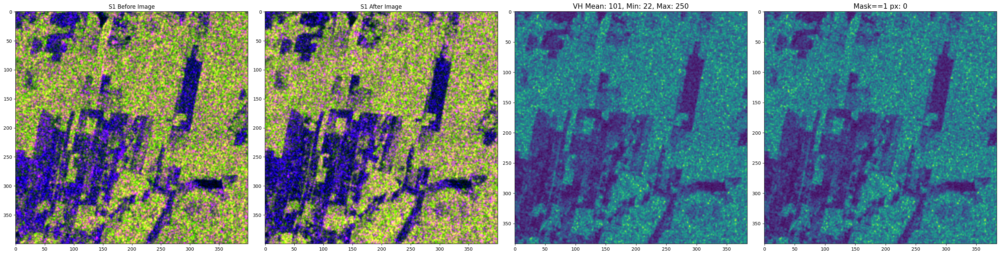

In [30]:
val_dataset.visualize(1)

data/1388042/sentinel1/1388042_sentinel1_S1A_IW_GRDH_1SDV_20241205T081058_20241205T081123_056854_06FB30_20241205_uncompressed.tif 4
data/1388042/sentinel1/1388042_sentinel1_S1A_IW_GRDH_1SDV_20250110T081055_20250110T081120_057379_070FF8_20250110_uncompressed.tif
data/1388042/1388042_20250101_mask.tif
Mask unique values: [0 1]


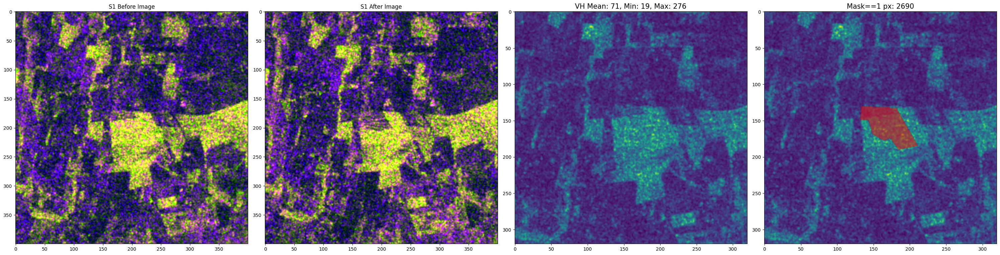

In [31]:
train_dataset.visualize(1)

In [ ]:
for fold_nb in range(0, 5):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    num_batches = 150 // (hps.train_batch_size * torch.cuda.device_count())
    hps.num_batches = num_batches
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)
    best_metric, best_metric_epoch = train(hps, train_loader, val_loader)

Concat model

In [ ]:
exp_nb = "S1_1-1"
path = "catalogues/2025_08_20_s1.pkl"
hps_dict = {
    ############
    # Data
    ############
    "df_path": path,

    ############
    # Training
    ############

    ## Experiment Setup
    "name": f"Exp_{exp_nb}",

    ## Model
    "num_classes": 1,
    "input_channel": 2*2,
    "backbone": "timm_efficientnet_b1",
    "pretrained": "noisy-student",
    "model": "concat_unetplusplus",

    # Training Setup
    "print_freq": 500,
    "patience": 8,
    "epoch_start_scheduler": 10,

    # Optimizer
    "lr": 0.001,
    "weight_decay": 0.0,

    ## Data Augmentation on CPU
    "train_crop_size": 256 + 32 + 32,
    "train_batch_size": 16, #32
    "da_brightness_magnitude": 0.0,
    "da_contrast_magnitude": 0.0,

    # Data Augmentation on GPU
    "gpu_da_params": [0.25],
    
    ### Loss, Metric
    "alpha": 0.5,
           }

for fold_nb in range(0, 5):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    num_batches = 150 // (hps.train_batch_size * torch.cuda.device_count())
    hps.num_batches = num_batches
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)
    best_metric, best_metric_epoch = train(hps, train_loader, val_loader)

# S2+S1 single before and after image, only one after image is active, the other is set to 0
- Only one after image is active (shows the most recent image we want to detect deforestation on), the other is set to 0
- Easy: Concatenate before, after S2 + before, after S1
- If there is no before image from a sensor it is also set to 0

## Create cross validation dataset
- Reuse the S1 and S2 datasets we created earlier and add an optional S1 before image to the S2 examples and an optional S2 before image to the S1 examples

In [25]:
df = pd.read_pickle("catalogues/2025_08_19_s2_l2a_16d.pkl")
df.shape

(165, 13)

In [35]:
s1_before_paths = []
for idx, row in df.iterrows():
    path_before = row["path_best_before"]
    path_after = row["path_best_after"]
    event_id_orig = row["event_id_for_folds"]
    event_id = row["event_id"]

    before_date = path_before.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
    before_date_str = f"{before_date[:4]}-{before_date[4:6]}-{before_date[6:8]}"
    
    date = path_after.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
    date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
    date = datetime.strptime(path_after.replace("_uncompressed", "").split('_')[-1].split('.')[0], "%Y%m%d")

    # Real deforestation: Use mask date as after cutoff
    if event_id_orig == event_id:
        mask_path = glob.glob(f"data/{event_id}/*_mask.tif")[0]
        mask_date = mask_path.split("/")[-1].split('_')[1]
        deforestation_date_str = f"{mask_date[:4]}-{mask_date[4:6]}-{mask_date[6:8]}"
        deforestation_date = datetime.strptime(mask_date, "%Y%m%d")
    else:
        # Synthetic no deforestation event: Use after date as cutoff
        deforestation_date_str = date_str
        deforestation_date = date

    print(f"S2 {before_date_str} --> {date_str}, Deforestation on {deforestation_date_str}")

    s1_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel1/*.tif") if not "_nrpb" in k and not "_rfdi" in k and not "_rvi" in k and not "_vv_vh_ratio" in k and not "compressed" in k])
    s1_before_path = "empty"
    if len(s1_paths) == 0:
        print(f"No S1 exists")
    else:
        # Sort by the date right before the .tif
        s1_paths = sorted(s1_paths, key=lambda p: datetime.strptime(p.split('_')[-1].split('.')[0], "%Y%m%d"))
        for s1_path in s1_paths:
            date = s1_path.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
            date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
            date = datetime.strptime(s1_path.replace("_uncompressed", "").split('_')[-1].split('.')[0], "%Y%m%d")

            # Use earliest S1 before the S2 deforestation date
            if date < deforestation_date:
                print(f"S1 before exists on {date_str}")
                s1_before_path = s1_path
                break
            else:
                print(f"S1 exists, but its after deforestation {date_str}")
    s1_before_paths.append(s1_before_path)
df["s1_before_path"] = s1_before_paths

S2 2025-02-18 --> 2025-05-30, Deforestation on 2025-05-01
No S1 exists
S2 2025-03-24 --> 2025-04-30, Deforestation on 2025-04-30
No S1 exists
S2 2025-05-03 --> 2025-05-30, Deforestation on 2025-05-30
No S1 exists
S2 2025-04-02 --> 2025-05-12, Deforestation on 2025-05-12
No S1 exists
S2 2025-05-27 --> 2025-06-03, Deforestation on 2025-06-03
No S1 exists
S2 2025-03-22 --> 2025-06-10, Deforestation on 2025-05-31
S1 before exists on 2025-05-06
S2 2025-03-21 --> 2025-06-07, Deforestation on 2025-05-16
S1 before exists on 2025-04-24
S2 2025-03-21 --> 2025-04-18, Deforestation on 2025-04-18
No S1 exists
S2 2025-05-28 --> 2025-06-07, Deforestation on 2025-06-07
No S1 exists
S2 2025-02-18 --> 2025-03-06, Deforestation on 2025-03-06
No S1 exists
S2 2025-03-06 --> 2025-05-27, Deforestation on 2025-05-15
S1 before exists on 2025-04-25
S2 2025-03-18 --> 2025-04-17, Deforestation on 2025-04-17
No S1 exists
S2 2025-05-25 --> 2025-05-27, Deforestation on 2025-05-27
No S1 exists
S2 2025-02-18 --> 2025-

In [22]:
df_s1 = pd.read_pickle("catalogues/2025_08_20_s1.pkl")
df_s1.shape

(64, 13)

Finding S2 before images to add to S1 before + S1 after images.
- S2 images can be way before the S1 before images, so I selected the first cloudfree S2 before image that is not more than 20 days away from the S1 before image

In [54]:
s2_before_paths = []
for idx, row in df_s1.iterrows():
    path_before = row["path_best_before"]
    path_after = row["path_best_after"]
    event_id_orig = row["event_id_for_folds"]
    event_id = row["event_id"]

    before_date = path_before.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
    before_date_str = f"{before_date[:4]}-{before_date[4:6]}-{before_date[6:8]}"
    before_date = datetime.strptime(path_before.replace("_uncompressed", "").split('_')[-1].split('.')[0], "%Y%m%d")
    
    date = path_after.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
    date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
    date = datetime.strptime(path_after.replace("_uncompressed", "").split('_')[-1].split('.')[0], "%Y%m%d")

    # Real deforestation: Use mask date as after cutoff
    if event_id_orig == event_id:
        mask_path = glob.glob(f"data/{event_id}/*_mask.tif")[0]
        mask_date = mask_path.split("/")[-1].split('_')[1]
        deforestation_date_str = f"{mask_date[:4]}-{mask_date[4:6]}-{mask_date[6:8]}"
        deforestation_date = datetime.strptime(mask_date, "%Y%m%d")
    else:
        # Synthetic no deforestation event: Use after date as cutoff
        deforestation_date_str = date_str
        deforestation_date = date

    print(f"S1 {before_date_str} --> {date_str}, Deforestation on {deforestation_date_str}")

    s2_l2a_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel2/*L2A*.tif") if not "ndvi" in k and not "ndwi" in k and not "compressed" in k])
    s2_16d_paths = sorted([k for k in glob.glob(f"data/{event_id}/sentinel2/*16D*.tif") if not "ndvi" in k and not "ndwi" in k and not "compressed" in k])
    
    s2_paths = s2_l2a_paths + s2_16d_paths
    s2_before_path = "empty"
    if len(s2_paths) == 0:
        print(f"No S2 exists")
    else:
        # Sort by the date right before the .tif
        s2_paths = sorted(s2_paths, key=lambda p: datetime.strptime(p.split('_')[-1].split('.')[0], "%Y%m%d"))
        for path in s2_paths:
            date = path.replace("_uncompressed", "").split("/")[-1].split('.')[0].split('_')[-1]
            date_str = f"{date[:4]}-{date[4:6]}-{date[6:8]}"
            date = datetime.strptime(path.replace("_uncompressed", "").split('_')[-1].split('.')[0], "%Y%m%d")

            # Use the earliest S2 before the S1 deforestation date
            difference_s1_s2_before_dates = (date - before_date).days
            if date < deforestation_date and abs(difference_s1_s2_before_dates) < 20:
                print(f"S2 before exists on {date_str}")
                # Check if its not too cloudy
                img_orig = tifffile.imread(path)
                if "L2A" in path:
                    scl = img_orig[:, :, -2].copy()
                    img_orig = img_orig[:, :, [11, 8, 4]]
                else:
                    scl = img_orig[:, :, -1].copy()
                    img_orig = img_orig[:, :, [10, 7, 3]]
                img_orig = img_orig.astype(np.float32)
                if scl.max() > 11:
                    if scl.max() > 50:
                        factor = 6
                    elif scl.max() > 45:
                        factor = 5
                    elif scl.max() >= 40:
                        factor = 4.5
                    else:
                        factor = 4
                    img_orig = (img_orig / factor).round(0)
                    scl_clean = (scl / factor).round(0).astype('uint8')   # back to 0..11
                else:
                    factor = 1
                    scl_clean = scl.copy()
                img_orig[img_orig == 0] = np.nan
                # low values, but all minimum above 1000 ==> Subtract by 1000
                if (np.nanmin(img_orig, axis=(0,1)) > 1000).sum() == 3:
                    img_orig = img_orig - 1000
                    img_orig[img_orig < 0] = np.nan
                
                cloudshadowmask = np.isin(scl_clean, [3, 8, 9, 10]).astype(np.uint8)   # clouds + shadows
                clouds_perc = 100 * cloudshadowmask.sum() / (img_orig.shape[0] * img_orig.shape[1])
                nodata_perc = 100 * np.isnan(img_orig[:, :, 0]).sum() / (img_orig.shape[0] * img_orig.shape[1])
                if clouds_perc + nodata_perc < 20:
                    s2_before_path = path
                    print(f"S2 has {clouds_perc + nodata_perc:.1f}% clouds/shadows/nodata --> USE")
                    break
                else:
                    print(f"S2 has {clouds_perc + nodata_perc:.1f}% clouds/shadows/nodata --> DONT USE")
            else:
                print(f"S2 exists, but its after deforestation {date_str} or is too far away from the S1 before path ({difference_s1_s2_before_dates} days)")
    s2_before_paths.append(s2_before_path)
    print("*"*100)
df_s1["s2_before_path"] = s2_before_paths

S1 2025-05-09 --> 2025-05-21, Deforestation on 2025-05-19
S2 exists, but its after deforestation 2025-03-25 or is too far away from the S1 before path (-45 days)
S2 exists, but its after deforestation 2025-04-02 or is too far away from the S1 before path (-37 days)
S2 exists, but its after deforestation 2025-04-12 or is too far away from the S1 before path (-27 days)
S2 exists, but its after deforestation 2025-04-14 or is too far away from the S1 before path (-25 days)
S2 exists, but its after deforestation 2025-04-17 or is too far away from the S1 before path (-22 days)
S2 before exists on 2025-04-22
S2 has 100.0% clouds/shadows/nodata --> DONT USE
S2 before exists on 2025-04-24
S2 has 89.2% clouds/shadows/nodata --> DONT USE
S2 before exists on 2025-05-04
S2 has 44.9% clouds/shadows/nodata --> DONT USE
S2 before exists on 2025-05-07
S2 has 97.9% clouds/shadows/nodata --> DONT USE
S2 before exists on 2025-05-12
S2 has 93.6% clouds/shadows/nodata --> DONT USE
S2 exists, but its after d

Fill in the 4 columns for every example: s2_before_path, s1_before_path, s2_after_path, s1_after_path
- Only one after path is always active
- 1-2 before paths are active

In [ ]:
df["after_sensor"] = "s2"
df["s1_after_path"] = "empty"
df["s2_after_path"] = df["path_best_after"].copy()
df["s2_before_path"] = df["path_best_before"].copy()
df = df.drop(["path_best_after", "path_best_before"], axis=1)

df_s1["after_sensor"] = "s1"
df_s1["s2_after_path"] = "empty"
df_s1["s1_after_path"] = df_s1["path_best_after"].copy()
df_s1["s1_before_path"] = df_s1["path_best_before"].copy()
df_s1 = df_s1.drop(["path_best_after", "path_best_before"], axis=1)

In [64]:
df = pd.concat((df, df_s1), ignore_index=True)
df.shape

(229, 16)

In [66]:
df["after_sensor"].value_counts()

after_sensor
s2    165
s1     64
Name: count, dtype: int64

In [71]:
only_s2_before_after = df.loc[(df["after_sensor"]=="s2") & (df["s1_before_path"]=="empty")].shape[0]
s2_with_s1_before = df.loc[(df["after_sensor"]=="s2") & (df["s1_before_path"]!="empty")].shape[0]
only_s1_before_after = df.loc[(df["after_sensor"]=="s1") & (df["s2_before_path"]=="empty")].shape[0]
s1_with_s2_before = df.loc[(df["after_sensor"]=="s1") & (df["s2_before_path"]!="empty")].shape[0]
print(f"Only S2 before + after: {only_s2_before_after}")
print(f"S2 with S1 before     : {s2_with_s1_before}")
print(f"Only S1 before + after: {only_s1_before_after}")
print(f"S1 with S2 before     : {s1_with_s2_before}")

Only S2 before + after: 132
S2 with S1 before     : 33
Only S1 before + after: 30
S1 with S2 before     : 34


In [73]:
event_id_for_folds = df["event_id_for_folds"].unique().tolist()
len(event_id_for_folds)

70

In [74]:
how_many_folds = 5
seed_start = 2222
best_std = 100000
best_seed = seed_start
event_id_for_folds = sorted(df["event_id_for_folds"].unique().tolist())

for seed in range(seed_start, seed_start + 1000):
    np.random.seed(seed)
    np.random.shuffle(event_id_for_folds)
    
    folds = list(range(how_many_folds)) * (len(event_id_for_folds) // how_many_folds + 1)
    np.random.seed(seed)
    np.random.shuffle(folds)
    folds = folds[:len(event_id_for_folds)]
    
    for fold_nb in range(how_many_folds):
        event_ids_per_fold = [event_id for fold, event_id in zip(folds, event_id_for_folds) if fold==fold_nb]
        # print(f"Fold {fold_nb}: {len(event_ids_per_fold)} Event Ids")
        df.loc[df["event_id_for_folds"].isin(event_ids_per_fold), "fold"] = fold_nb
    
    std_deforest_pxs = df.groupby("fold")["deforest_pxs"].sum().std()
    if std_deforest_pxs < best_std:
        best_std = std_deforest_pxs
        best_seed = seed
        best_df = df.copy()
        print(f"Seed {seed}, Std Deforest Pxs: {std_deforest_pxs:.0f}")
        # display(df.groupby("fold")["deforest_pxs"].sum().to_frame())
df = best_df.copy()

Seed 2222, Std Deforest Pxs: 5456
Seed 2255, Std Deforest Pxs: 5082
Seed 2283, Std Deforest Pxs: 4267
Seed 2285, Std Deforest Pxs: 3291
Seed 2389, Std Deforest Pxs: 3133
Seed 2411, Std Deforest Pxs: 2449
Seed 2442, Std Deforest Pxs: 2408
Seed 2498, Std Deforest Pxs: 1772
Seed 2771, Std Deforest Pxs: 979


In [75]:
df.groupby("fold")["deforest_pxs"].sum()

fold
0.0    19667
1.0    22023
2.0    20547
3.0    21854
4.0    21334
Name: deforest_pxs, dtype: int64

To speed up data loading during training, it helps to save the tifs uncompressed.
- Even faster would be to do most preprocessing before, e.g. loading before/after images, eventual resizing, dropping of bands, normalizing, subtracting offsets, ... and in the dataloader only loading in the final array and doing augmentations.

In [98]:
for idx, row in df.iterrows():
    for col in ["s1_before_path", "s1_after_path", "s2_before_path", "s2_after_path"]:
        if row[col] == "empty":
            continue
        input_path = row[col].replace("_uncompressed", "")
        output_path = input_path.replace(".tif", "_uncompressed.tif")
        if not os.path.exists(output_path):
            with rasterio.open(input_path) as src:
                profile = src.profile
                profile["compress"] = None
                with rasterio.open(output_path, "w", **profile) as dst:
                    dst.write(src.read())

for col in ["s1_before_path", "s1_after_path", "s2_before_path", "s2_after_path"]:
    df[col] = df[col].apply(lambda x: x.replace(".tif", "_uncompressed.tif") if not "_uncompressed.tif" in x else x)

In [99]:
os.makedirs("catalogues", exist_ok=True)
df.to_pickle("catalogues/2025_08_21_s2_s1.pkl")
print(df.shape)

(229, 16)


## Train

In [32]:
exp_nb = "S2_S1_1-0"
path = "catalogues/2025_08_21_s2_s1.pkl"
hps_dict = {
    ############
    # Data
    ############
    "df_path": path,

    ############
    # Training
    ############

    ## Experiment Setup
    "name": f"Exp_{exp_nb}",

    ## Model
    "num_classes": 1,
    "input_channel": 13*2 + 2*2,
    "backbone": "timm_efficientnet_b1",
    "pretrained": "noisy-student",
    "model": "concat_unetplusplus",

    # Training Setup
    "print_freq": 500,
    "patience": 8,
    "epoch_start_scheduler": 10,

    # Optimizer
    "lr": 0.001,
    "weight_decay": 0.0,

    ## Data Augmentation on CPU
    "train_crop_size": 256 + 32 + 32,
    "train_batch_size": 16, #32
    "da_brightness_magnitude": 0.0,
    "da_contrast_magnitude": 0.0,

    # Data Augmentation on GPU
    "gpu_da_params": [0.25],
    
    ### Loss, Metric
    "alpha": 0.5,
           }
for fold_nb in range(0, 1):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 0 --> Train: 198, Val: 31
####################################################################################################
Last 5 sample weights: [1, 1, 1, 1, 1]


empty 15
empty
data/1387970/sentinel2/1387970_sentinel2_S2B_MSIL2A_20241116T131239_N0511_R138_T23LPH_20241116T152128_20241116_uncompressed.tif
data/1387970/sentinel2/1387970_sentinel2_S2B_MSIL2A_20250105T131239_N0511_R138_T23LPH_20250105T145637_20250105_uncompressed.tif
data/1387970/1387970_20250101_mask.tif
Mask unique values: [0 1]


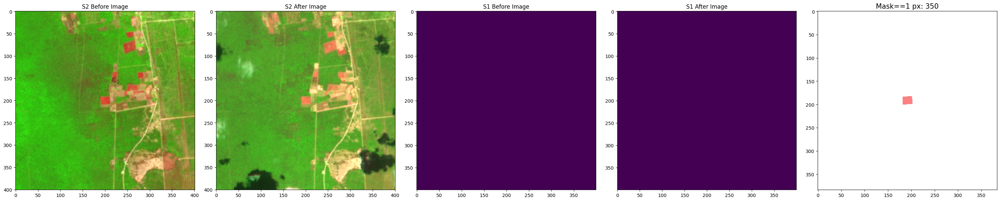

In [33]:
val_dataset.visualize(1)

data/1387925/sentinel1/1387925_sentinel1_S1A_IW_GRDH_1SDV_20250122T081004_20250122T081029_057554_0716E7_20250122_uncompressed.tif 194
data/1387925/sentinel1/1387925_sentinel1_S1A_IW_GRDH_1SDV_20250215T081003_20250215T081028_057904_0724D9_20250215_uncompressed.tif
data/1387925/sentinel2/1387925_sentinel2_S2A_MSIL2A_20250104T125311_N0511_R052_T24MXT_20250104T154849_20250104_uncompressed.tif
empty
data/1387925/1387925_20250201_mask.tif
Mask unique values: [0 1]


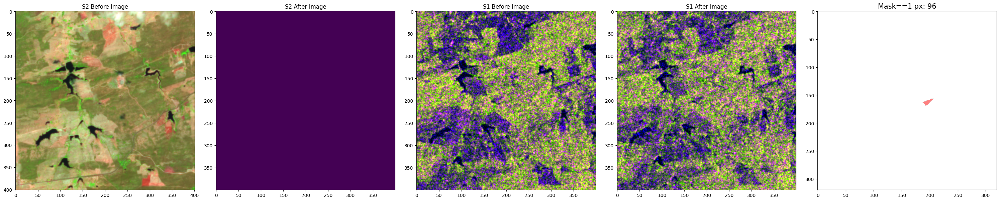

In [35]:
train_dataset.visualize(1)

In [104]:
for fold_nb in range(0, 5):
    hps = HyperParams(**hps_dict)
    hps.fold_nb = fold_nb
    num_batches = 250 // (hps.train_batch_size * torch.cuda.device_count())
    hps.num_batches = num_batches
    train_dataset, train_loader, val_dataset, val_loader = get_dataloaders(hps)

    best_metric, best_metric_epoch = train(hps, train_loader, val_loader)

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 0 --> Train: 198, Val: 31
####################################################################################################
We want to train 15 batches in each epoch, but our current dataset is only 12 batches long. Doubling dataset size
Last 5 sample weights: [1, 1, 1, 1, 1]


21-Aug-25 11:37:19 - Training with 1 GPUS


concat_unetplusplus timm-efficientnet-b1 noisy-student BatchNorm: True Decoder Channel: [256, 128, 64, 32, 16], Decoder Attention Type: None


21-Aug-25 11:37:29 - Ep: [1] TotalT: 0.2 min, BatchT: 0.584s, DataT: 0.346s, GpuDaT: 0.005s, Loss: 0.7079
21-Aug-25 11:37:35 - Ep: [1]  ValT: 0.10 min, BatchT: 5.852s, DataT: 4.022s, Loss: 0.6407, IoU: 0.0000 (val)
21-Aug-25 11:37:46 - Ep: [2] TotalT: 0.5 min, BatchT: 0.589s, DataT: 0.376s, GpuDaT: 0.005s, Loss: 0.5518
21-Aug-25 11:37:50 - Ep: [2]  ValT: 0.06 min, BatchT: 3.581s, DataT: 3.420s, Loss: 0.5377, IoU: 0.0000 (val)
21-Aug-25 11:38:00 - Ep: [3] TotalT: 0.7 min, BatchT: 0.593s, DataT: 0.398s, GpuDaT: 0.005s, Loss: 0.5248
21-Aug-25 11:38:04 - Ep: [3]  ValT: 0.06 min, BatchT: 3.632s, DataT: 3.470s, Loss: 0.5211, IoU: 0.0000 (val)
21-Aug-25 11:38:15 - Ep: [4] TotalT: 0.9 min, BatchT: 0.587s, DataT: 0.332s, GpuDaT: 0.004s, Loss: 0.5146
21-Aug-25 11:38:19 - Ep: [4]  ValT: 0.06 min, BatchT: 3.691s, DataT: 3.528s, Loss: 0.5135, IoU: 0.0000 (val)
21-Aug-25 11:38:30 - Ep: [5] TotalT: 1.2 min, BatchT: 0.580s, DataT: 0.385s, GpuDaT: 0.004s, Loss: 0.5114
21-Aug-25 11:38:34 - Ep: [5]  ValT

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 1 --> Train: 180, Val: 49
####################################################################################################
We want to train 15 batches in each epoch, but our current dataset is only 11 batches long. Doubling dataset size
Last 5 sample weights: [1, 1, 1, 1, 1]


21-Aug-25 12:04:44 - Training with 1 GPUS


concat_unetplusplus timm-efficientnet-b1 noisy-student BatchNorm: True Decoder Channel: [256, 128, 64, 32, 16], Decoder Attention Type: None


21-Aug-25 12:05:02 - Ep: [1] TotalT: 0.3 min, BatchT: 1.049s, DataT: 0.828s, GpuDaT: 0.005s, Loss: 0.6307
21-Aug-25 12:05:12 - Ep: [1]  ValT: 0.16 min, BatchT: 4.892s, DataT: 3.350s, Loss: 0.6835, IoU: 0.0055 (val)
21-Aug-25 12:05:28 - Ep: [2] TotalT: 0.7 min, BatchT: 0.805s, DataT: 0.597s, GpuDaT: 0.005s, Loss: 0.5280
21-Aug-25 12:05:35 - Ep: [2]  ValT: 0.11 min, BatchT: 3.432s, DataT: 3.291s, Loss: 0.5227, IoU: 0.0000 (val)
21-Aug-25 12:05:51 - Ep: [3] TotalT: 1.1 min, BatchT: 0.869s, DataT: 0.660s, GpuDaT: 0.005s, Loss: 0.5109
21-Aug-25 12:05:59 - Ep: [3]  ValT: 0.13 min, BatchT: 3.762s, DataT: 3.617s, Loss: 0.5304, IoU: 0.0000 (val)
21-Aug-25 12:06:16 - Ep: [4] TotalT: 1.5 min, BatchT: 0.920s, DataT: 0.711s, GpuDaT: 0.005s, Loss: 0.5061
21-Aug-25 12:06:21 - Ep: [4]  ValT: 0.10 min, BatchT: 2.938s, DataT: 2.803s, Loss: 0.5020, IoU: 0.0000 (val)
21-Aug-25 12:06:40 - Ep: [5] TotalT: 1.9 min, BatchT: 1.004s, DataT: 0.788s, GpuDaT: 0.005s, Loss: 0.4957
21-Aug-25 12:06:48 - Ep: [5]  ValT

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 2 --> Train: 180, Val: 49
####################################################################################################
We want to train 15 batches in each epoch, but our current dataset is only 11 batches long. Doubling dataset size
Last 5 sample weights: [1, 1, 1, 1, 1]


21-Aug-25 12:38:34 - Training with 1 GPUS


concat_unetplusplus timm-efficientnet-b1 noisy-student BatchNorm: True Decoder Channel: [256, 128, 64, 32, 16], Decoder Attention Type: None


21-Aug-25 12:38:54 - Ep: [1] TotalT: 0.3 min, BatchT: 1.062s, DataT: 0.819s, GpuDaT: 0.006s, Loss: 0.6092
21-Aug-25 12:39:00 - Ep: [1]  ValT: 0.10 min, BatchT: 3.108s, DataT: 2.976s, Loss: 0.5390, IoU: 0.0000 (val)
21-Aug-25 12:39:21 - Ep: [2] TotalT: 0.8 min, BatchT: 1.061s, DataT: 0.815s, GpuDaT: 0.006s, Loss: 0.5229
21-Aug-25 12:39:26 - Ep: [2]  ValT: 0.09 min, BatchT: 2.661s, DataT: 2.524s, Loss: 0.5162, IoU: 0.0000 (val)
21-Aug-25 12:39:48 - Ep: [3] TotalT: 1.2 min, BatchT: 1.186s, DataT: 0.960s, GpuDaT: 0.005s, Loss: 0.5031
21-Aug-25 12:39:53 - Ep: [3]  ValT: 0.08 min, BatchT: 2.301s, DataT: 2.171s, Loss: 0.5138, IoU: 0.0000 (val)
21-Aug-25 12:40:13 - Ep: [4] TotalT: 1.6 min, BatchT: 1.063s, DataT: 0.828s, GpuDaT: 0.006s, Loss: 0.5039
21-Aug-25 12:40:19 - Ep: [4]  ValT: 0.10 min, BatchT: 2.955s, DataT: 2.824s, Loss: 0.5118, IoU: 0.0000 (val)
21-Aug-25 12:40:39 - Ep: [5] TotalT: 2.1 min, BatchT: 1.040s, DataT: 0.811s, GpuDaT: 0.005s, Loss: 0.4922
21-Aug-25 12:40:45 - Ep: [5]  ValT

Train Data Augmentations: [RandomCrop(p=1.0, border_mode=0, fill=0.0, fill_mask=0.0, height=320, pad_if_needed=False, pad_position='center', width=320)]
Train Image Data Augmentations: []
####################################################################################################
####################################################################################################
Fold 3 --> Train: 174, Val: 55
####################################################################################################
We want to train 15 batches in each epoch, but our current dataset is only 10 batches long. Doubling dataset size
Last 5 sample weights: [1, 1, 1, 1, 1]


ValueError: For the experiment Exp_S2_S1_1-0 there already exist weight paths (['trained_models/Exp_S2_S1_1-0/fold_3/2025-08-21_14-16-29/best_metric_30_0.1263.pt']). Choose a different experiment name or delete the existing weight paths